# How do waves add?

From the recent homework, you found that a physically reasonable PDE for a wave on a string is the aptly-named wave equation:

$\frac{\partial^2 y}{\partial x^2} = \frac{1}{v^2}\frac{\partial^2 y}{\partial t^2}$

You will recall from an earlier homework set that you verified the d'Alembert solution to the wave equation: if $y(x,t)$ is a solution, then both $y(x-vt)$ and $y(x+vt)$ are solutions. In particular, we expect that

$sin(x-vt)$

and

$sin(x+vt)$

ought to be solutions. Those are *traveling* waves, where before we found *standing* wave solutions. The claim here is that you can add two traveling waves to get a standing wave. That seems pretty shocking at first, so let's look at it:

## Single wave moving to the right

We'll set up some bits and pieces of Python to graph things for us, and then we'll plot $sin(x - vt)$. This will verify that it's a traveling wave, and that it's moving to the right.

First, the basic Python setup

In [1]:
from __future__ import division
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from JSAnimation import IPython_display
from matplotlib import animation


Now we set up the thing we want to plot. We'll control the plot axes with outerlim, and make 2000 points between -outerlim and outerlim:


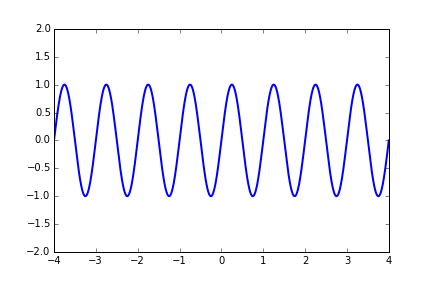
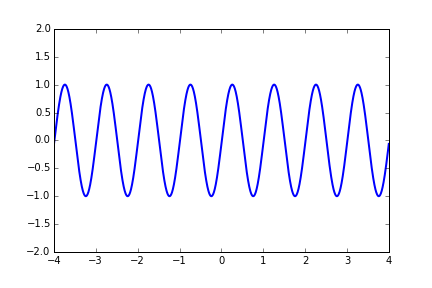
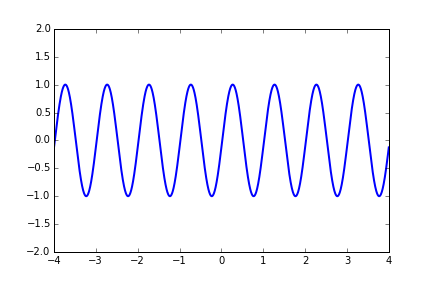
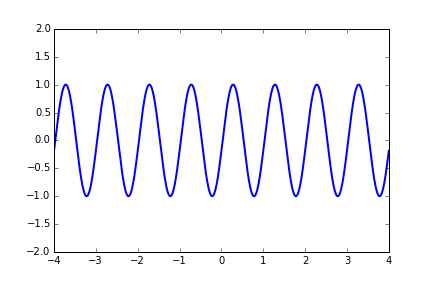
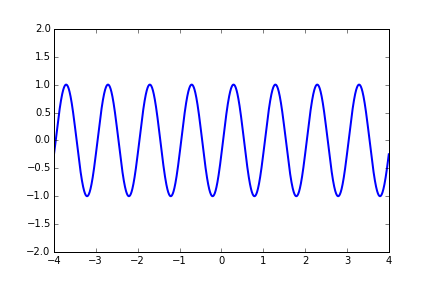
...
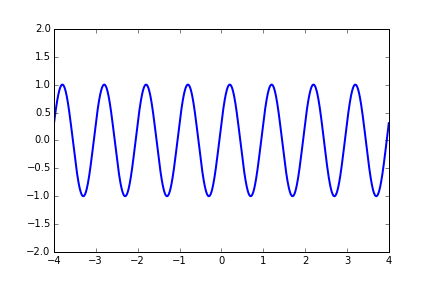
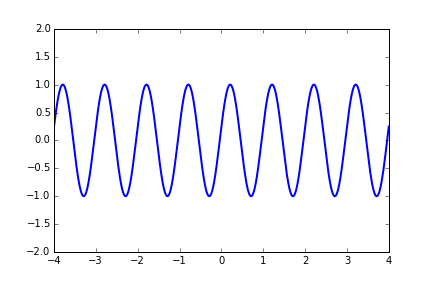
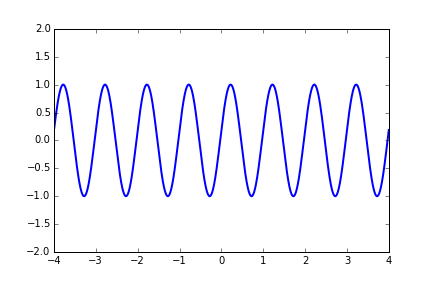
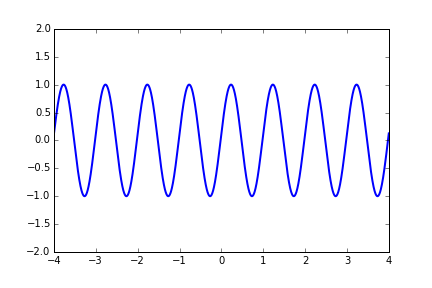
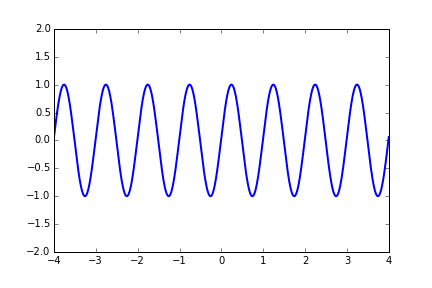

In [2]:
# First set up the figure, the axis, and the plot element we want to animate
outerlim = 4
v = 0.01
fig = plt.figure()
ax = plt.axes(xlim=(-outerlim, outerlim), ylim=(-2, 2))
line, = ax.plot([], [], lw=2, color='blue')

# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    return line,

# animation function.  This is called sequentially
x = np.linspace(-outerlim, outerlim, 2000)

def animate(t):
    y = np.sin(2 * np.pi * (x - v * t))
    line.set_data(x, y)
    return line,

# call the animator.  blit=True means only re-draw the parts that have changed.
animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=20, blit=True)

## To the left

What happens if we change v to point the other way? The only difference in the below code is that we've set `v = -0.01` and colored the line red:


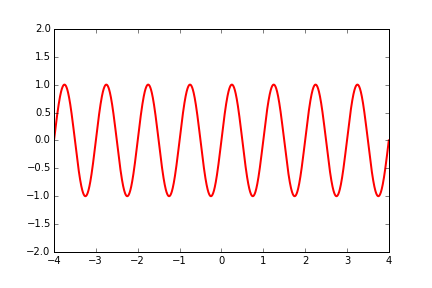
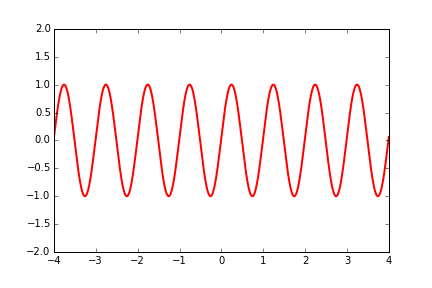
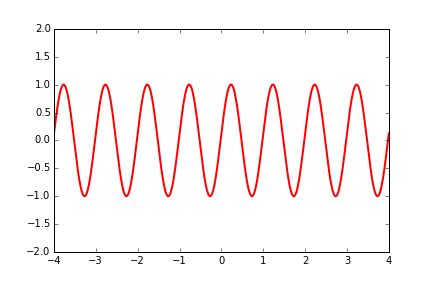
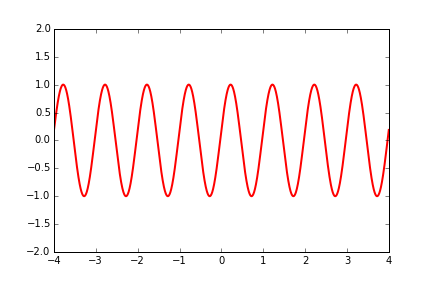
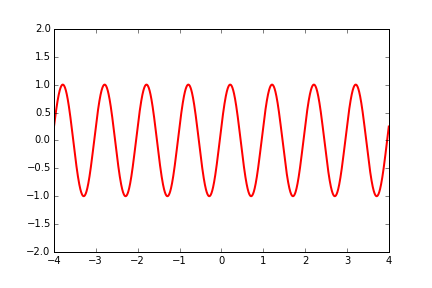
...
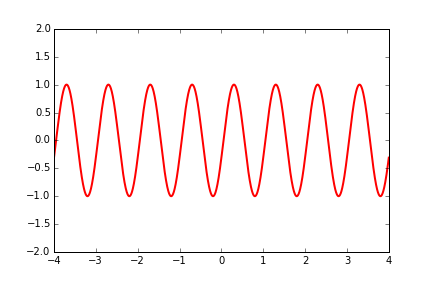
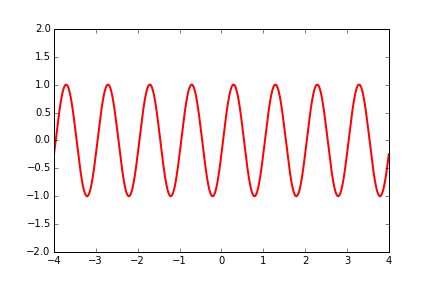
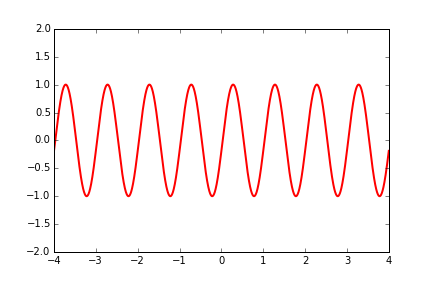
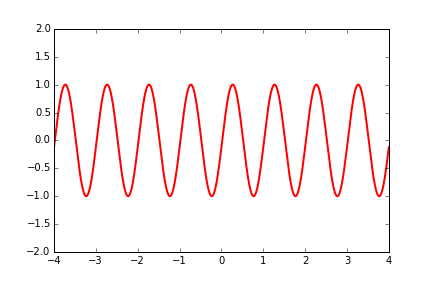
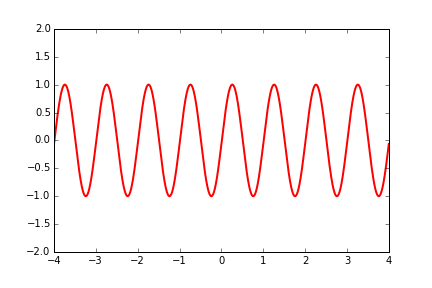

In [3]:
v = -0.01
fig = plt.figure()
ax = plt.axes(xlim=(-outerlim, outerlim), ylim=(-2, 2))
line, = ax.plot([], [], lw=2, color='red')

# call the animator.  blit=True means only re-draw the parts that have changed.
animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=20, blit=True)


## Both

What if we add them together? We need to have two lines in our plot. Otherwise, this looks like the above code, specifying both `v1` and `v2`.


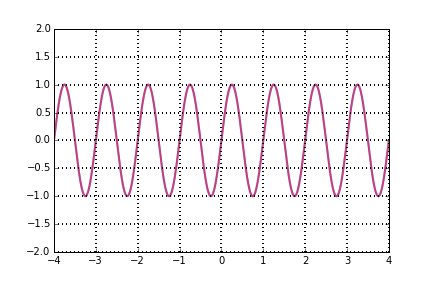
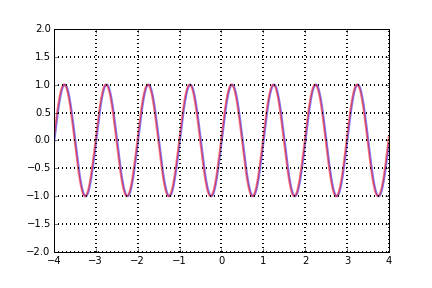
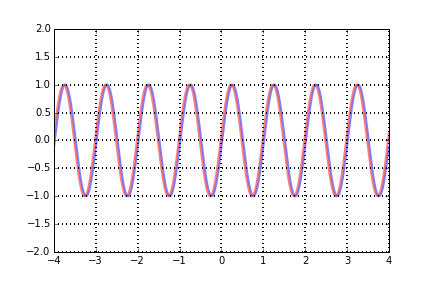
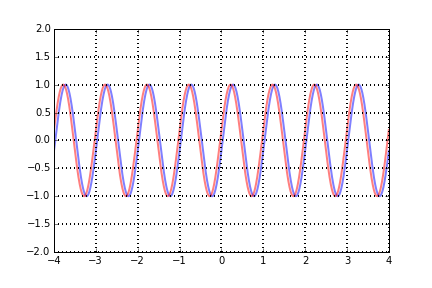
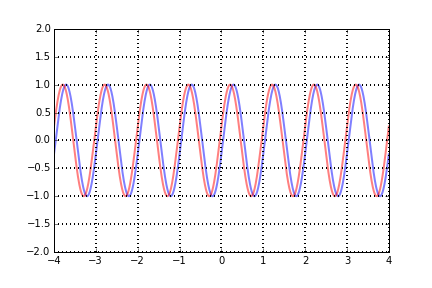
...
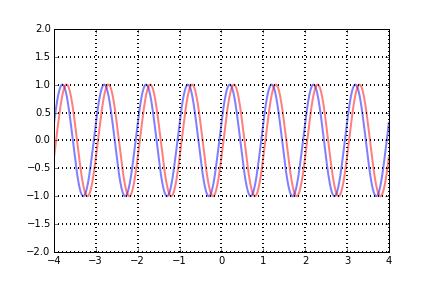
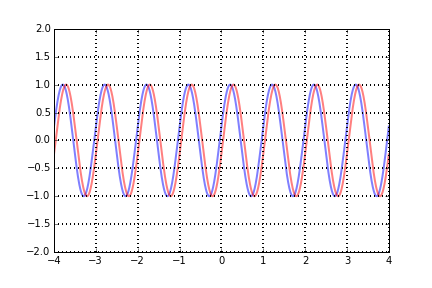
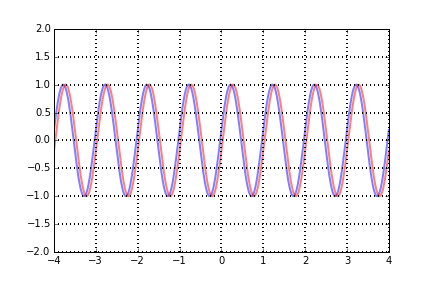
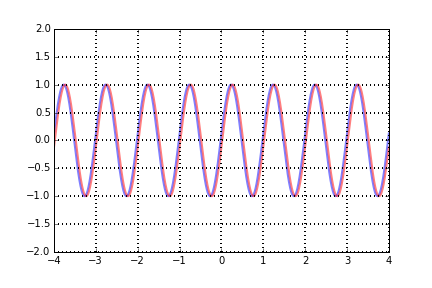
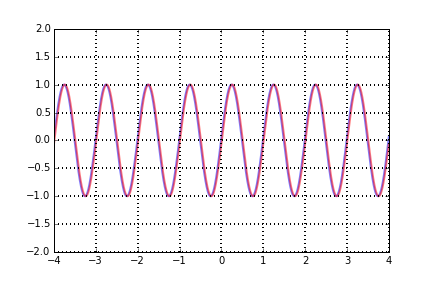

In [4]:
v1, v2 = 0.01, -0.01
fig = plt.figure()
ax = plt.axes(xlim=(-outerlim, outerlim), ylim=(-2, 2))
line1, = ax.plot([], [], lw=2, color='blue', alpha=0.5)
line2, = ax.plot([], [], lw=2, color='red', alpha=0.5)

# initialization function: plot the background of each frame
def init():
    line1.set_data([], [])
    line2.set_data([], [])
    plt.grid(True,linewidth=2)
    return line1, line2


def animate(t):
    y1 = np.sin(2 * np.pi * (x - v1 * t))
    y2 = np.sin(2 * np.pi * (x - v2 * t))
    line1.set_data(x, y1)
    line2.set_data(x, y2)
    return line1, line2

# call the animator.  blit=True means only re-draw the parts that have changed.
animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=20, blit=True)



Stare at that for a bit. Convince yourself that one wave is moving one way, and the other is moving the other. Then try to figure out what would happen if you added the two together.

Once you've thought about it, we can write some code, this time with three lines. To make the plot clearer, we'll only plot the sum in the middle (hence `innerlim` etc.):


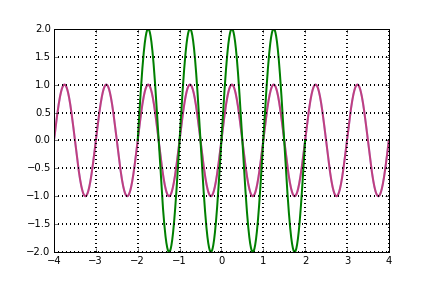
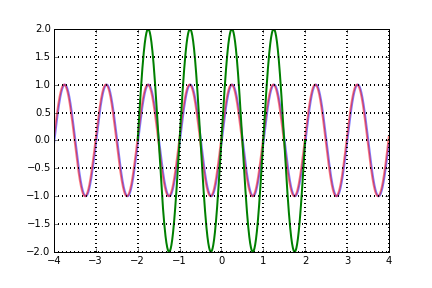
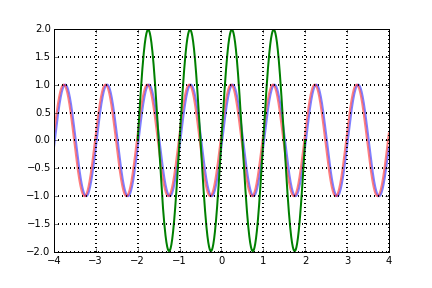
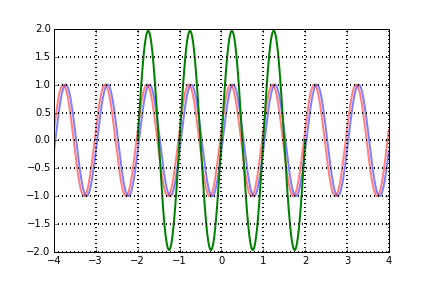
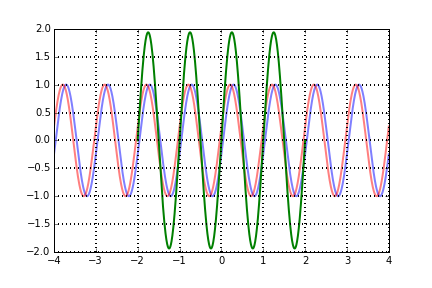
...
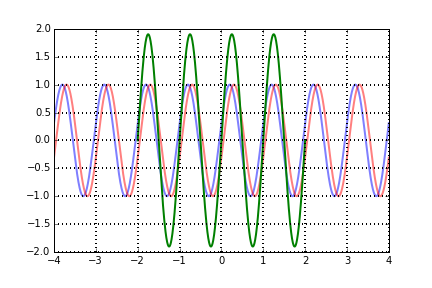
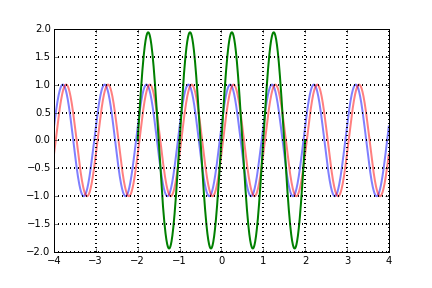
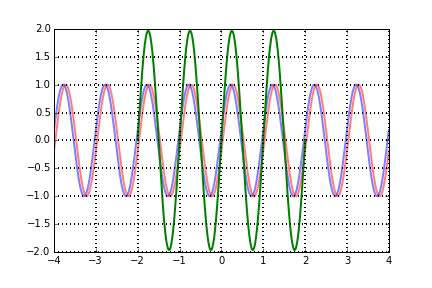
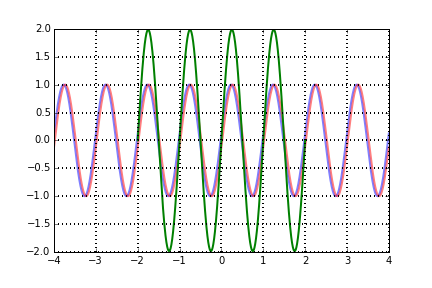
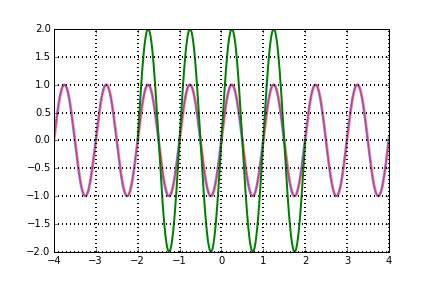

In [5]:
v1, v2 = 0.01, -0.01
innerlim = 2
fig = plt.figure()
ax = plt.axes(xlim=(-outerlim, outerlim), ylim=(-2, 2))
line1, = ax.plot([], [], lw=2, color='blue', alpha=0.5)
line2, = ax.plot([], [], lw=2, color='red', alpha=0.5)
line3, = ax.plot([], [], lw=2, color='green', )


# initialization function: plot the background of each frame
def init():
    line1.set_data([], [])
    line2.set_data([], [])
    line3.set_data([], [])
    plt.grid(True,linewidth=2)
    return line1, line2, line3

# animation function.  This is called sequentially
x_both = np.linspace(-innerlim, innerlim, 1000)

def animate(t):
    y1 = np.sin(2 * np.pi * (x - v1 * t))
    y2 = np.sin(2 * np.pi * (x - v2 * t))
    y3 = np.sin(2 * np.pi * (x_both - v2 * t)) + np.sin(2 * np.pi * (x_both + v2 * t))
    line1.set_data(x, y1)
    line2.set_data(x, y2)
    line3.set_data(x_both, y3)
    return line1, line2, line3

# call the animator.  blit=True means only re-draw the parts that have changed.
animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=20, blit=True)

Then we remembered the concept of "beats" from when we were talking about sound. How might we get beats here? One thought was that we need to change the velocities. Let's try multiplying one of the velocities by something strange like 7.32214


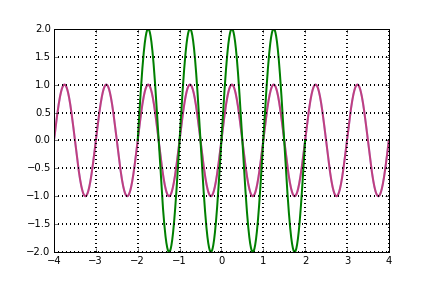
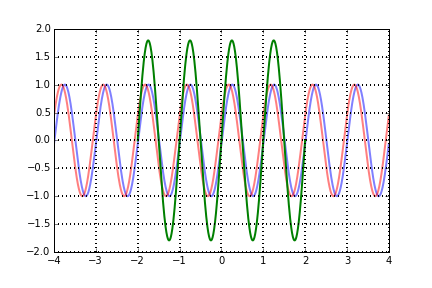
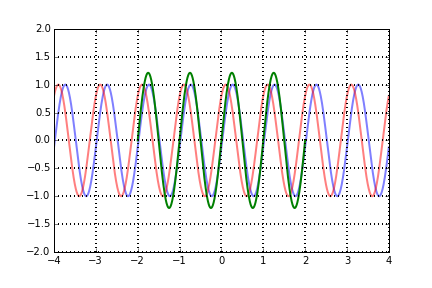
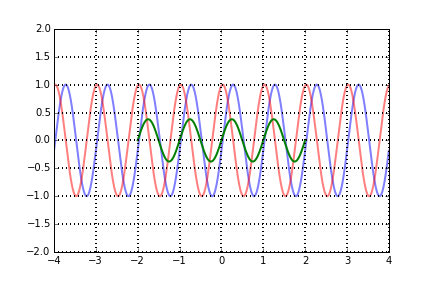
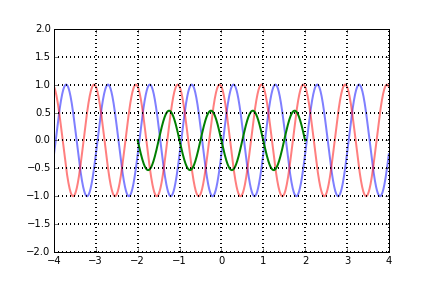
...
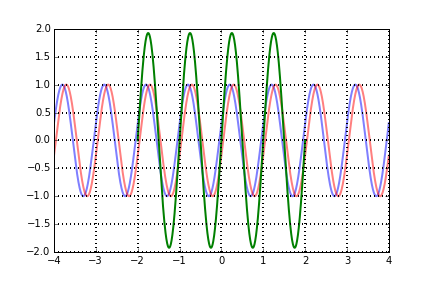
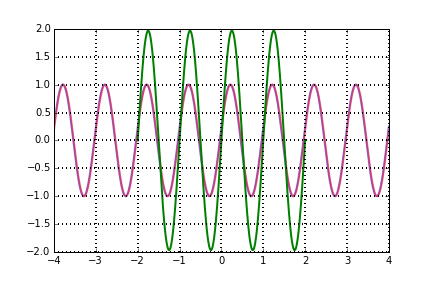
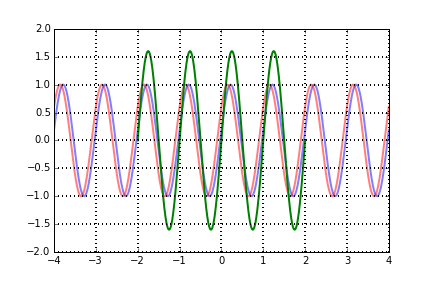
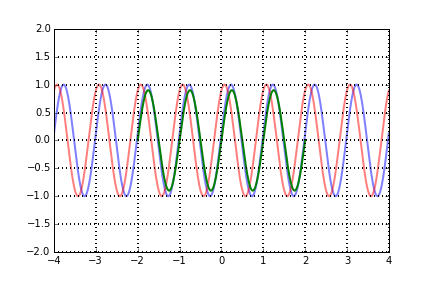
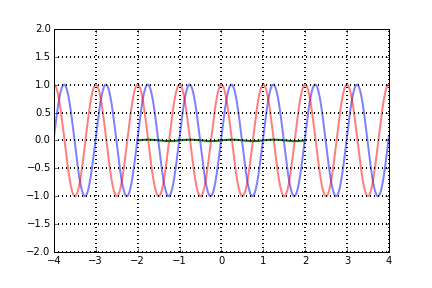

In [6]:
v1, v2 = 0.01, -0.01*7.32214
fig = plt.figure()
ax = plt.axes(xlim=(-outerlim, outerlim), ylim=(-2, 2))
line1, = ax.plot([], [], lw=2, color='blue', alpha=0.5)
line2, = ax.plot([], [], lw=2, color='red', alpha=0.5)
line3, = ax.plot([], [], lw=2, color='green', )

animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=20, blit=True)

You may need to slow that down a bit (using the minus sign button on the left), but you can clearly see that

    * one wave is moving much faster than the other
    * we still get a standing wave
    
That's reasonable to get an intuitive understanding for: the waves still look the same, you're just sliding them across each other faster than last time. When they line up, you get constructive interference. When they are 90 degrees out of phase, they cancel.

After some discussion, we figured out that we need to change the *frequency* of one of the waves.


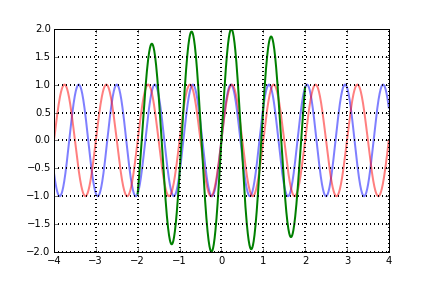
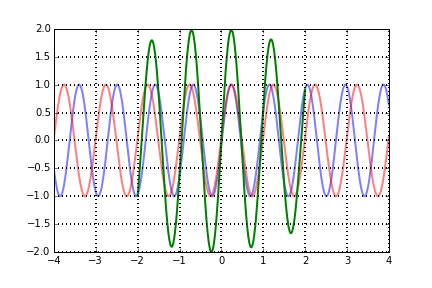
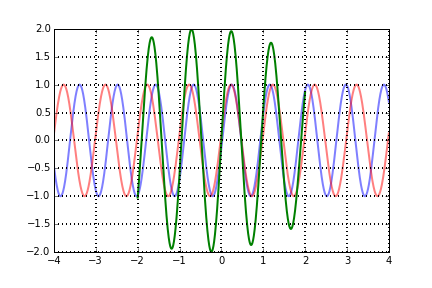
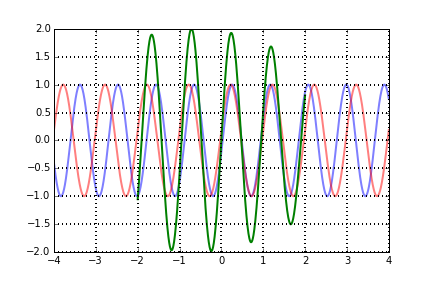
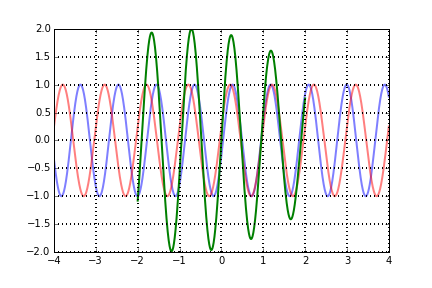
...
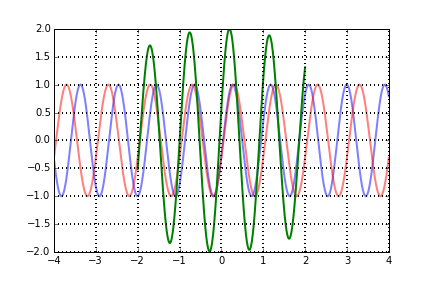
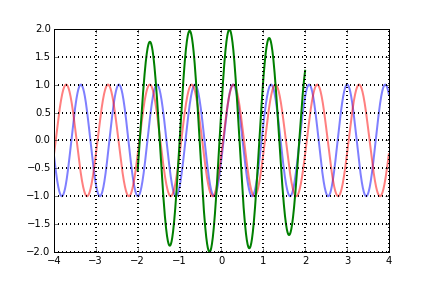
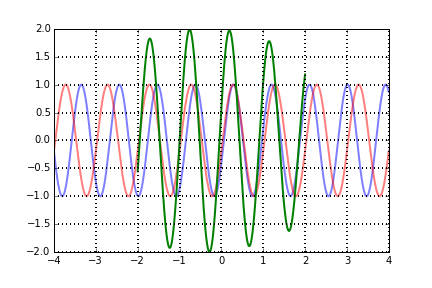
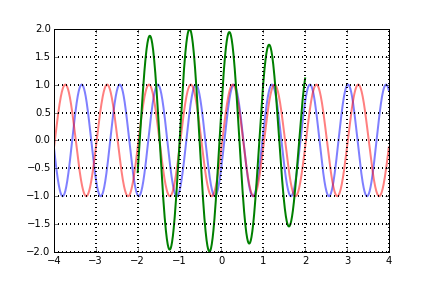
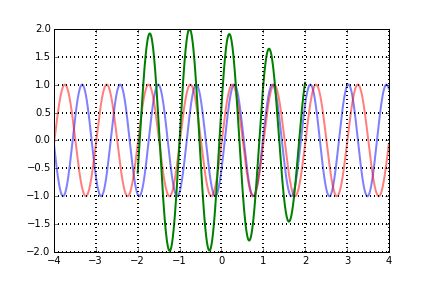

In [7]:
v1, v2 = 0.01, -0.01
fig = plt.figure()
ax = plt.axes(xlim=(-outerlim, outerlim), ylim=(-2, 2))
line1, = ax.plot([], [], lw=2, color='blue', alpha=0.5)
line2, = ax.plot([], [], lw=2, color='red', alpha=0.5)
line3, = ax.plot([], [], lw=2, color='green', )

frequency_factor = 1.1

def animate(t):
    y1 = np.sin(2 * frequency_factor * np.pi * (x - v1 * t))
    y2 = np.sin(2 * np.pi * (x - v2 * t))
    y3 = np.sin(2 * frequency_factor * np.pi * (x_both - v2 * t)) + np.sin(2 * np.pi * (x_both + v2 * t))
    line1.set_data(x, y1)
    line2.set_data(x, y2)
    line3.set_data(x_both, y3)
    return line1, line2, line3


animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=20, blit=True)